In [15]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.constants as constants
from qiskit_signals.quantum_axis import (
    AngularWavenumberAxis,
    EncodingType,
    PositionAxis,
)
from wave_optics_propagation.analytics import (
    free_space_propagated_gaussian_wavefront,
    gaussian_signal,
    propagated_gaussian_wavefront_hitting_lens,
)
from wave_optics_propagation.visualization import plot_wavefunction

### Initial parameters


In [16]:
# beam parameters
vacuum_wavelength = 1e-6
beam_FWHM = 5e-3 * 1e-2

# lens parameters
focal_length = 200e-3 * 1e-2
# lens_diameter = 25e-3
refractive_index = 1.5

# free space propagation parameters
propagation_after_lens = 1.5 * focal_length

# simulation parameters
transverse_length = 100e-3 * 1e-2  # transverse simulation window
num_of_steps_after_lens = 10
lens_slices = 10000
num_qubits = 10
max_delta = 0.0001

# lens_diameter = 50e-3 * 1e-2
lens_diameter = transverse_length

### Constants


In [17]:
c = constants.c
# hbar = constants.hbar

### Derived parameters


In [18]:
# geometry
radius_of_curvature = focal_length * (refractive_index - 1)
lens_radius = lens_diameter / 2
lens_thickness = radius_of_curvature - np.sqrt(radius_of_curvature**2 - lens_radius**2)


k_0 = 2 * constants.pi / vacuum_wavelength
reduced_wavelength = vacuum_wavelength / refractive_index

dimension = 2**num_qubits
delta_x = transverse_length / dimension

gaussian_mean = transverse_length / 2
gaussian_beam_waist = beam_FWHM / np.sqrt(2 * np.log(2))
# gaussian_sigma = gaussian_beam_waist / np.sqrt(2)

# vacuum_rayleigh_length = (np.pi * gaussian_beam_waist**2) / vacuum_wavelength

lens_slice_thickness = lens_thickness / lens_slices
step_size_after_lens = propagation_after_lens / num_of_steps_after_lens

In [19]:
print(delta_x, vacuum_wavelength)

9.765625e-07 1e-06


In [20]:
x_axis = PositionAxis(
    num_qubits=num_qubits, delta_x=delta_x, encoding=EncodingType.UNSIGNED
)
twos_complement_x_axis = PositionAxis(
    num_qubits=num_qubits,
    delta_x=delta_x,
    encoding=EncodingType.TWOS_COMPLEMENT_MIRRORED,
)
k_axis = AngularWavenumberAxis.from_position_axis(x_axis)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

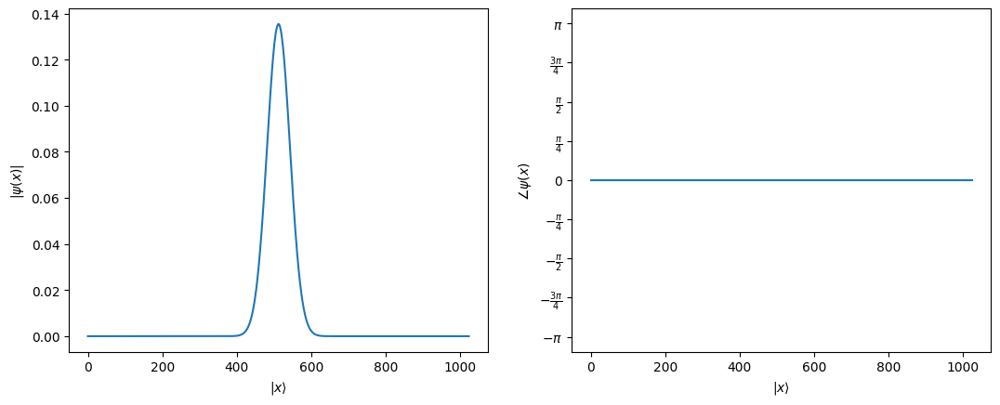

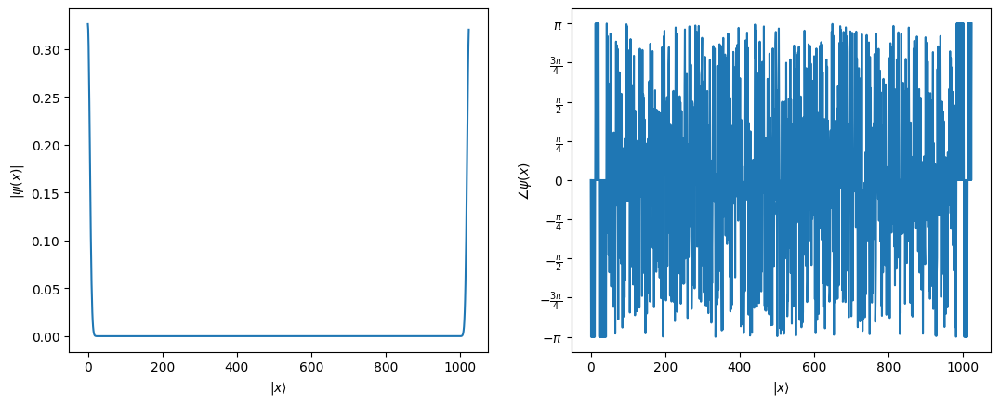

In [21]:
initial_wavefunction = gaussian_signal(
    x_axis,
    gaussian_beam_waist,
    gaussian_mean,
)
plot_wavefunction(initial_wavefunction.data)
plot_wavefunction(np.fft.fft(initial_wavefunction.data, norm="ortho"))

A lens applies a phase as

$$
e^{-ik_0\frac{x^2}{2f}}
$$


-262143.99999999994


(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

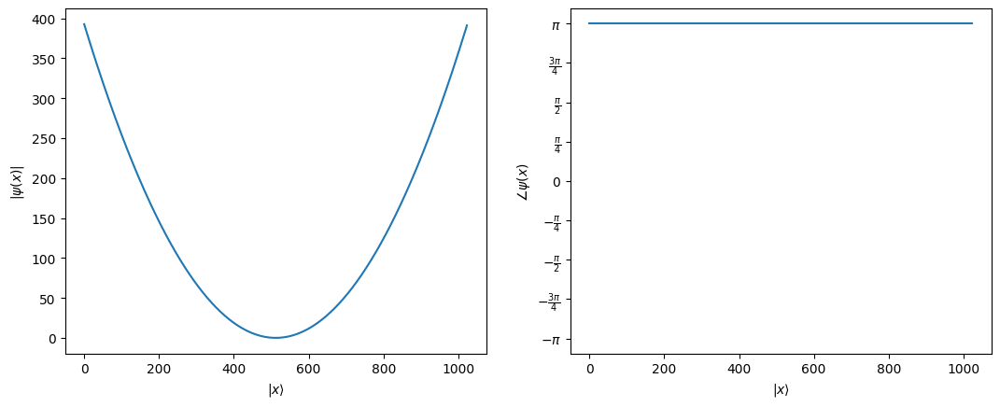

In [22]:
from qiskit_signals.quantum_signal import PolynomialQuantumSignal

lens_signal = PolynomialQuantumSignal(
    axis=twos_complement_x_axis, alpha=-k_0 / 2 / focal_length, power=2
)

print((lens_signal.data / k_0 * 2 * focal_length / delta_x**2).min())
plot_wavefunction(lens_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

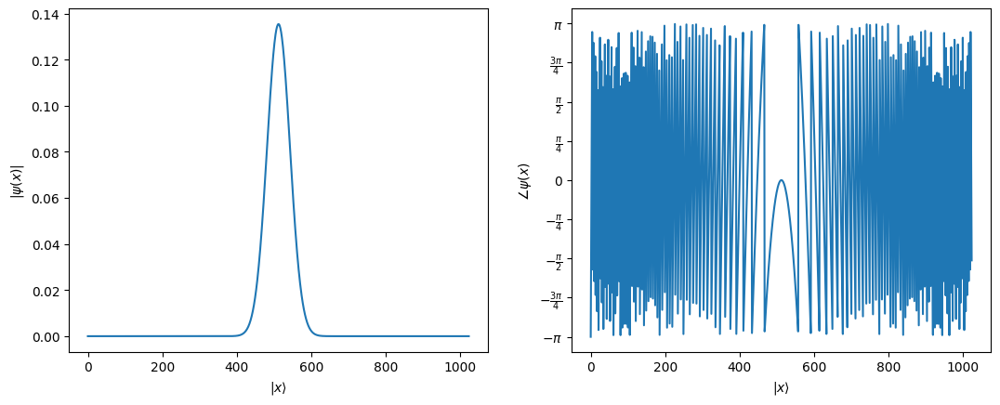

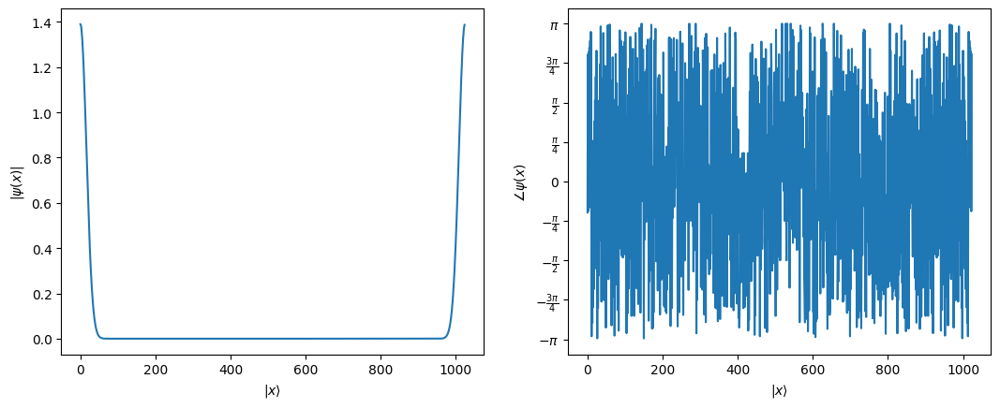

In [23]:
wavefront_after_lens = initial_wavefunction.data * np.exp(1j * lens_signal.data)
plot_wavefunction(wavefront_after_lens)
plot_wavefunction(np.fft.fft(wavefront_after_lens, norm="ortho"), normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

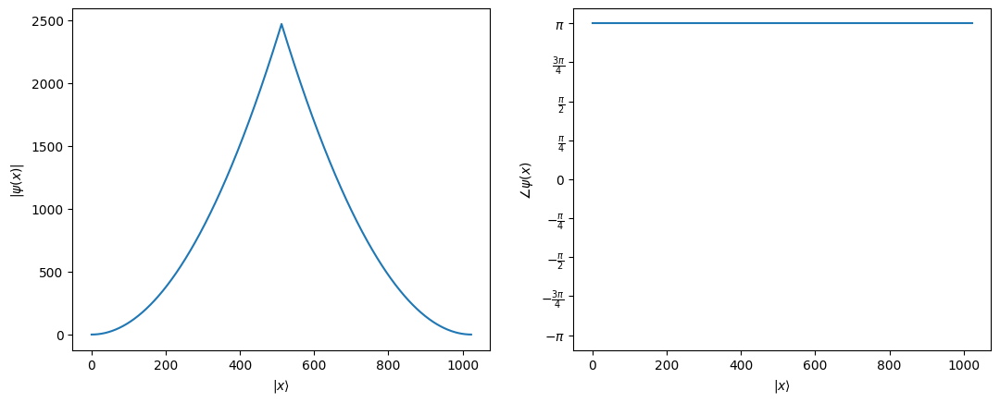

In [24]:
from wave_optics_propagation.elements import free_space_signal_generator

free_space_signal = free_space_signal_generator(
    k_axis,
    delta_t=propagation_after_lens / constants.c,
    wavelength=vacuum_wavelength,
    c=constants.c,
)

plot_wavefunction(free_space_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

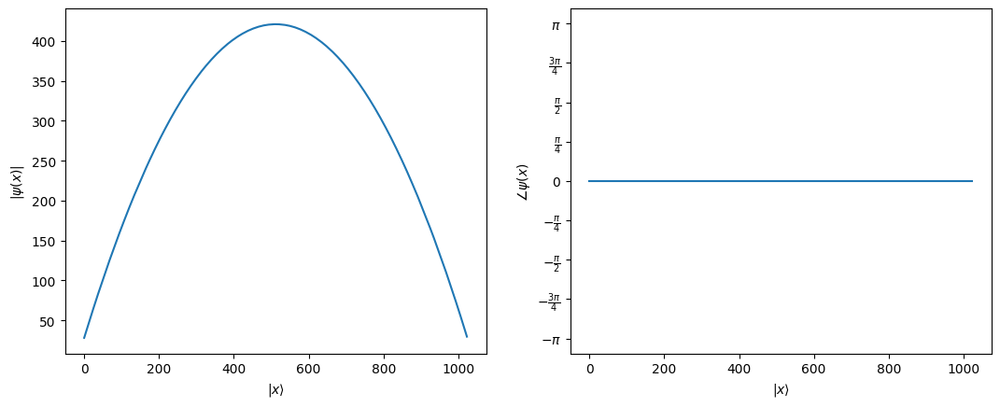

In [25]:
from wave_optics_propagation.elements import (
    radius_of_convex_planar_lens_as_a_func_of_z,
    thin_transparent_plate_signal_generator,
)

lens_slice_positions = (
    np.linspace(0, lens_thickness, lens_slices, endpoint=False)
    + lens_slice_thickness / 2
)  # choosing the midpoint in each transverse slice

lens_transverse_radii = [
    radius_of_convex_planar_lens_as_a_func_of_z(
        radius_of_curvature, z, lens_thickness, fresnel_approximation=True
    )
    for z in lens_slice_positions
]


lens_signals = [
    thin_transparent_plate_signal_generator(
        x_axis=x_axis,
        refractive_index=refractive_index,
        thickness=lens_slice_thickness,
        radius=lens_radius,
        wavelength=vacuum_wavelength,
        # scale_down=True,
        scale_down=False,
    )
    for lens_radius in lens_transverse_radii
]

sum_signal = np.zeros_like(lens_signals[0].data)
for signal in lens_signals:
    sum_signal += signal.data

plot_wavefunction(sum_signal, normalize=False)

[420.89895338 420.88168761 420.90950725 ... 420.89823359 420.90950725
 420.88168761]
28.19987168497706 -392.6990816987241
420.8936072383833 -0.0
420.8936072384665 1262.6808217153994


(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

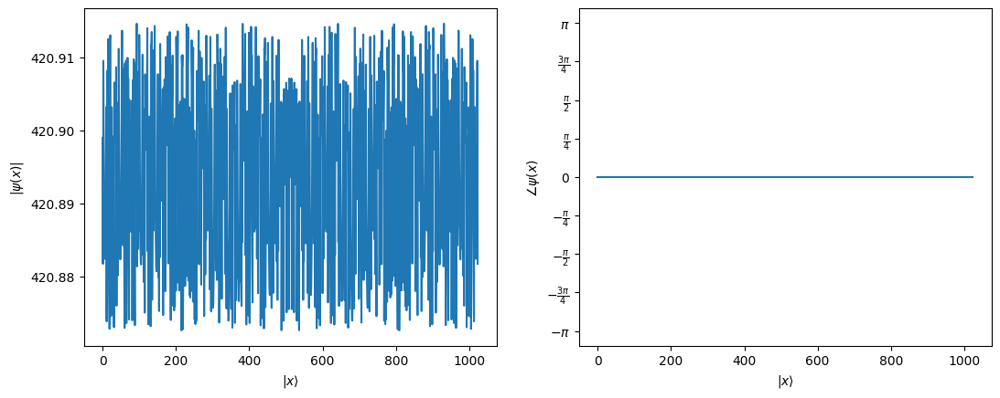

In [26]:
print(sum_signal - lens_signal.data)
print(sum_signal[0], lens_signal.data[0])
print(sum_signal[len(sum_signal) // 2], lens_signal.data[len(lens_signal.data) // 2])
print(
    refractive_index * k_0 * lens_thickness / 3, refractive_index * k_0 * lens_thickness
)
# assert np.allclose(sum_signal, lens_signal.data)
plot_wavefunction(sum_signal - lens_signal.data, normalize=False)

(<Figure size 1280x480 with 2 Axes>,
 (<Axes: xlabel='$|x\\rangle$', ylabel='$|\\psi(x)|$'>,
  <Axes: xlabel='$|x\\rangle$', ylabel='$\\angle\\psi(x)$'>))

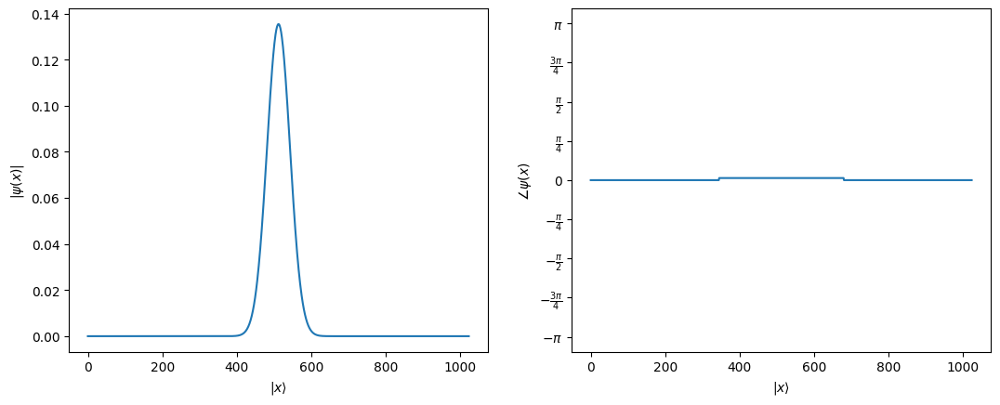

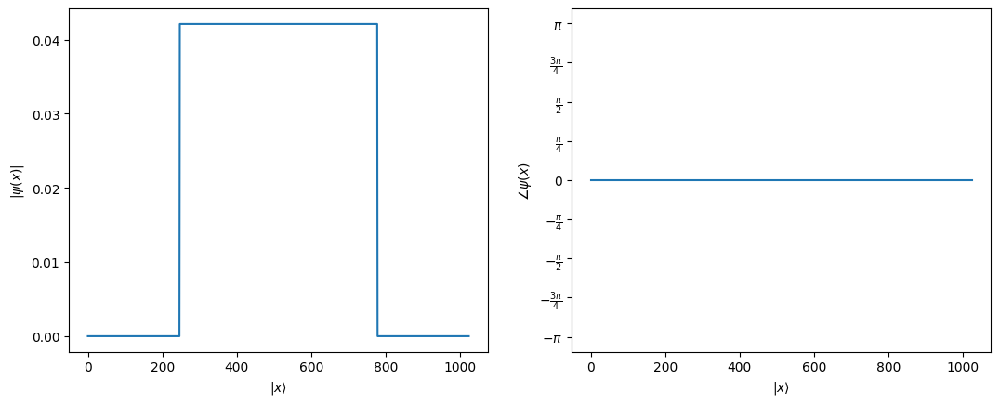

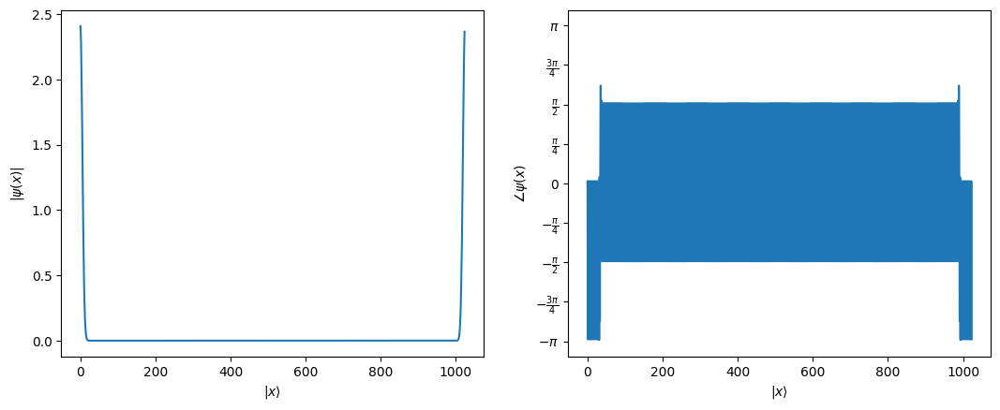

In [27]:
signal_data = initial_wavefunction.data.copy()
signal_data = signal_data * np.exp(1j * lens_signals[lens_slices // 10].data)
plot_wavefunction(signal_data)
plot_wavefunction(lens_signals[lens_slices // 4].data, normalize=False)
plot_wavefunction(np.fft.fft(signal_data, norm="ortho"), normalize=False)

Doing lens slice 1/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.01240060000299459
Doing lens slice 2/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.023029685719847096
Doing lens slice 3/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.030115742864415436
Doing lens slice 4/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.033658771436699604
Doing lens slice 5/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.04074482858126794
Doing lens slice 6/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.04428785715355211
Doing lens slice 7/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.04783088572583628
Doing lens slice 8/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.051373914298120445
Doing lens slice 9/10000
max value in signal: 0.04208936072384664
sum of amplitude square: 0.054916942870404

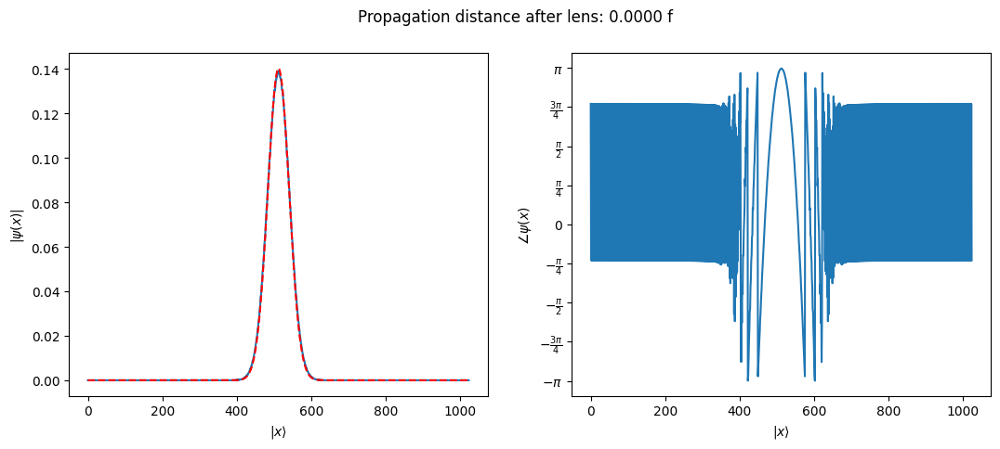

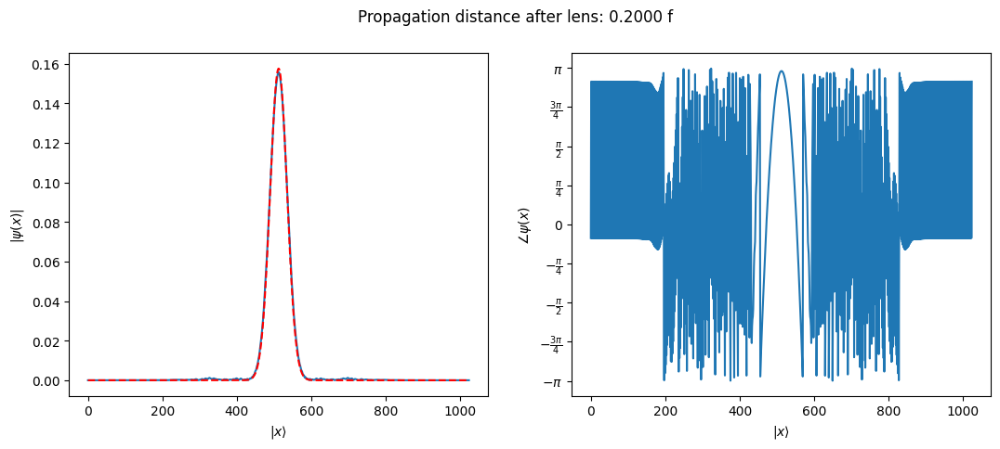

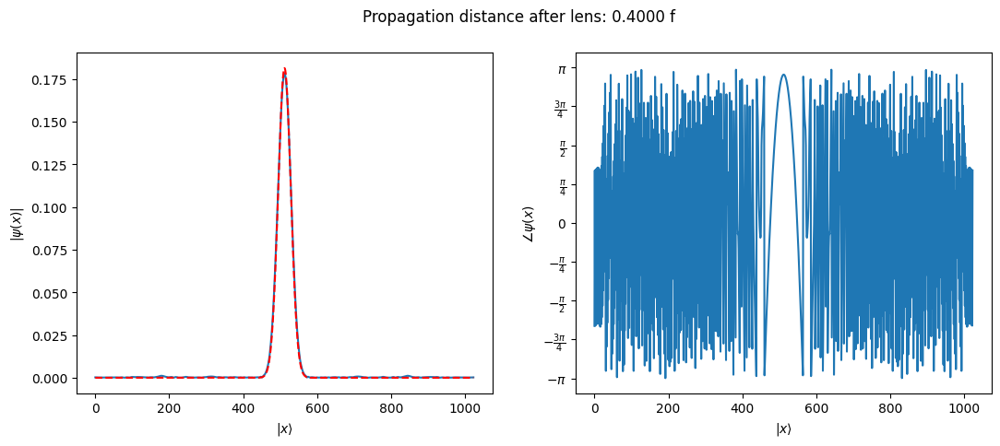

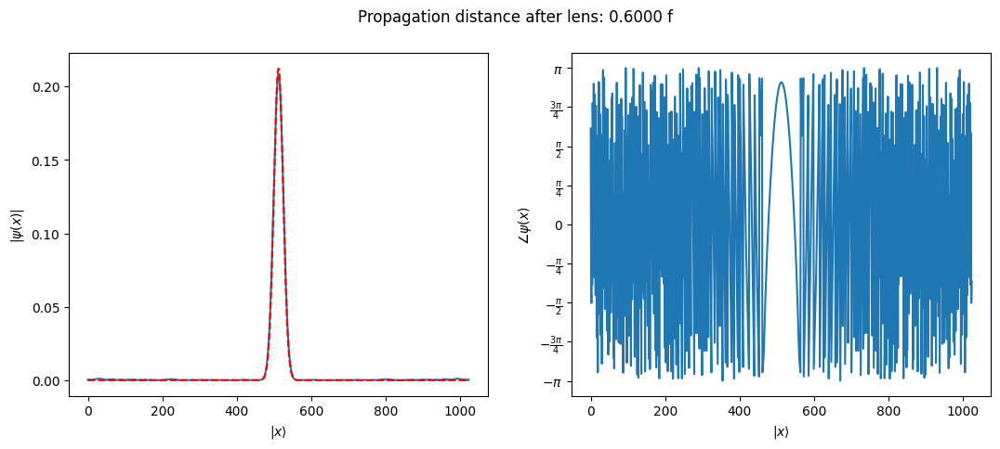

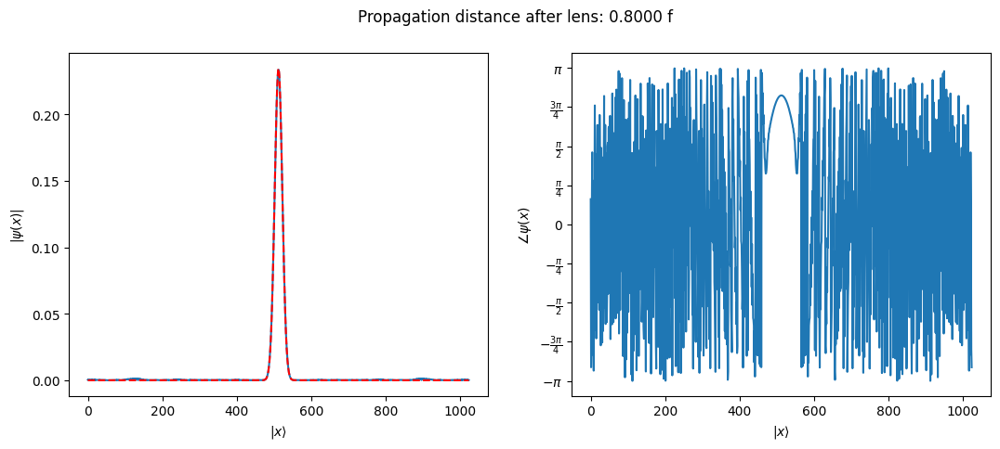

...

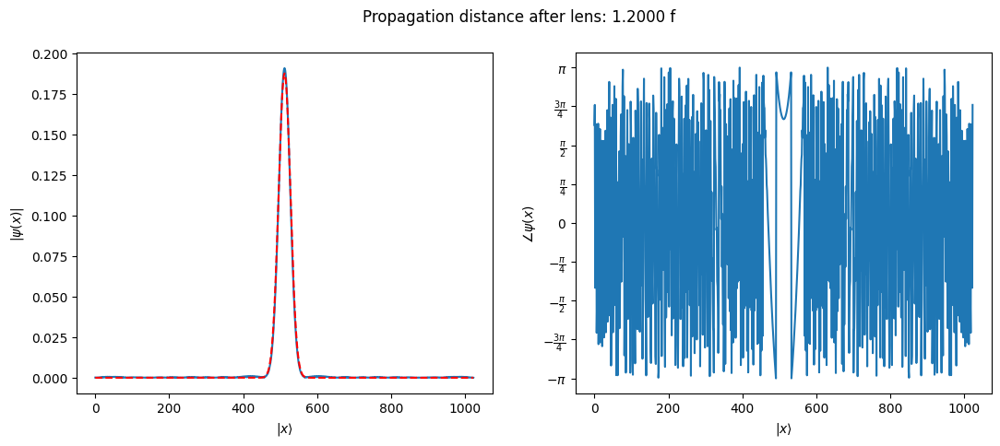

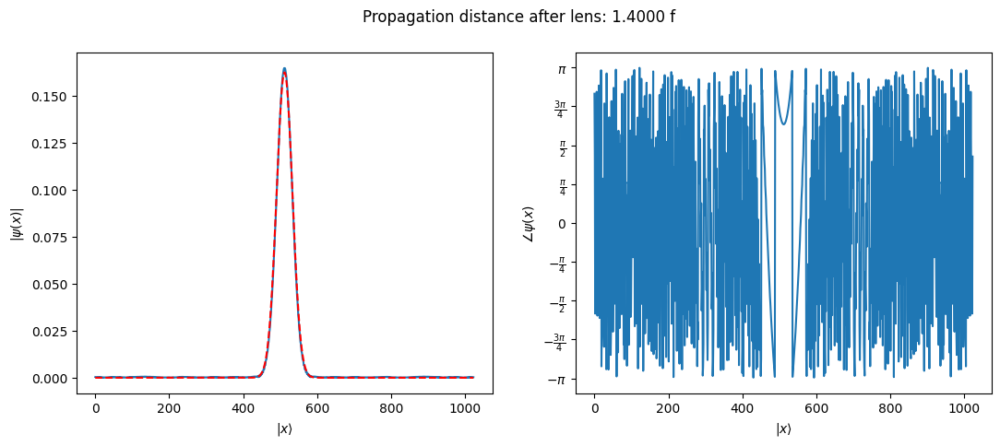

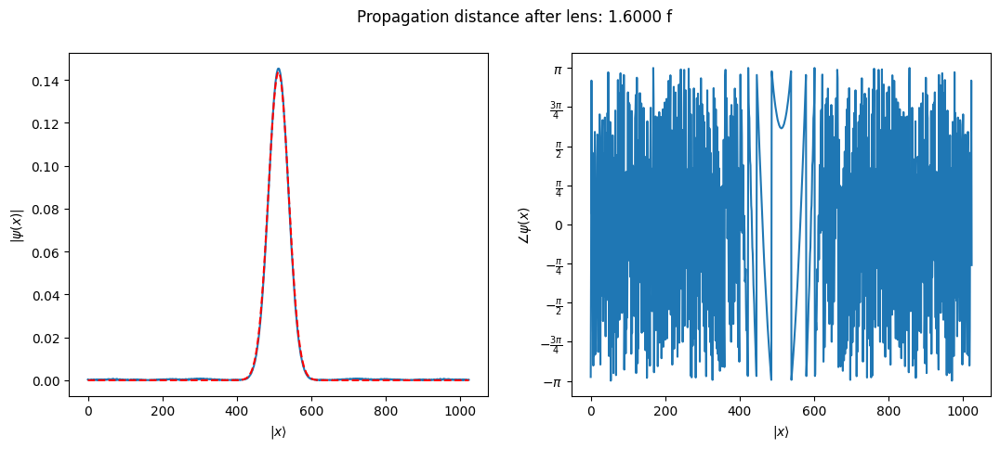

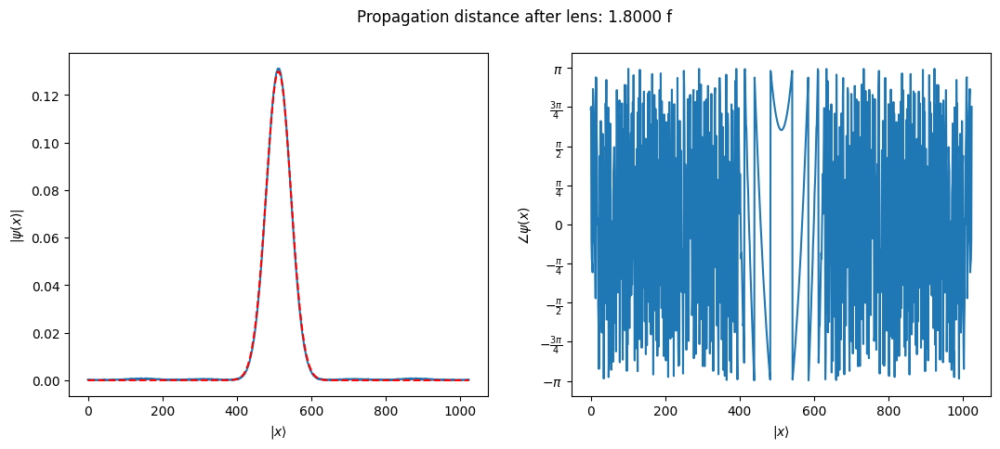

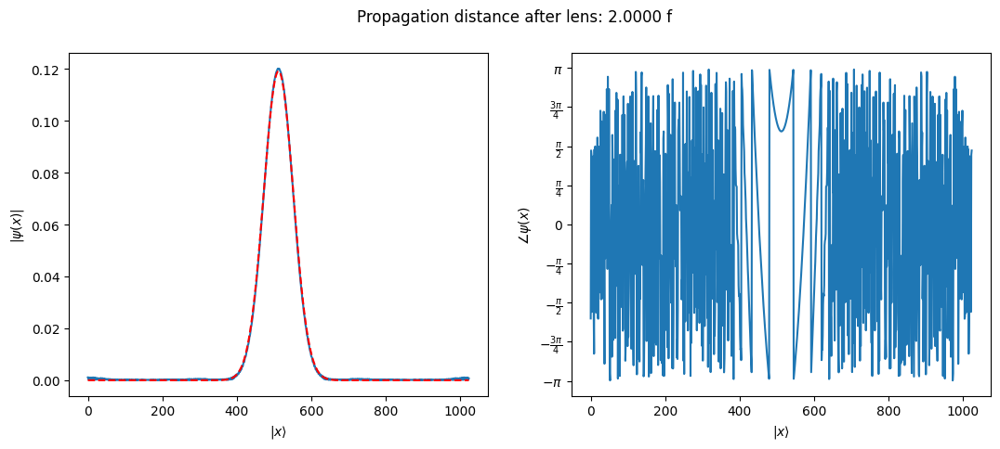

In [28]:
zs = np.array([0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0]) * focal_length
for z in zs:
    inside_lens_propagation_remained = lens_thickness
    total_lenses_simulated = 0
    signal_data = initial_wavefunction.data.copy()
    step_size_after_lens = z / num_of_steps_after_lens

    for i, lens_radius in enumerate(lens_transverse_radii):
        print(f"Doing lens slice {i + 1}/{lens_slices}")

        lens_signal_loop = lens_signals[i]

        if not np.isclose(np.std(lens_signal_loop.data), 0):
            print(f"max value in signal: {np.max(np.abs(lens_signal_loop.data))}")
            print(
                f"sum of amplitude square: {np.sum(np.abs(lens_signal_loop.data) ** 2)}"
            )
            # continue
            signal_data = signal_data * np.exp(1j * lens_signal_loop.data)
            total_lenses_simulated += 1

        else:
            print("Skipped the lens slice because it is a flat phase.")
            break

    # remaining propagation once the lens slice grows larger than the simulation window
    while inside_lens_propagation_remained > 0:
        propagator_signal = free_space_signal_generator(
            k_axis=k_axis,
            delta_t=inside_lens_propagation_remained / c,
            wavelength=reduced_wavelength,
            c=constants.c,
        )

        fourier_transformed = np.fft.fft(signal_data, norm="ortho")
        propagated = fourier_transformed * np.exp(1j * propagator_signal.data)
        signal_data = np.fft.ifft(propagated, norm="ortho")

        inside_lens_propagation_remained -= inside_lens_propagation_remained

    for i in range(num_of_steps_after_lens):
        print(f"Doing free space step {i + 1}/{num_of_steps_after_lens}")

        propagator_signal = free_space_signal_generator(
            k_axis=k_axis,
            delta_t=step_size_after_lens / c,
            wavelength=vacuum_wavelength,
            c=constants.c,
        )

        fourier_transformed = np.fft.fft(signal_data, norm="ortho")
        propagated = fourier_transformed * np.exp(1j * propagator_signal.data)
        signal_data = np.fft.ifft(propagated, norm="ortho")

    fig, (ax1, ax2) = plot_wavefunction(signal_data)

    R_z, w_z = propagated_gaussian_wavefront_hitting_lens(
        gaussian_beam_waist,
        z + lens_thickness,
        focal_length,
        vacuum_wavelength,
        1,
    )

    signal_with_lens = gaussian_signal(x_axis, w_z, gaussian_mean)
    ax1.plot(signal_with_lens.data / np.linalg.norm(signal_with_lens.data), "r--")
    fig.suptitle(f"Propagation distance after lens: {z / focal_length:.4f} f")